# Pycortex

Let's take a NIFTI file and map it to pycortex. This can't be hard... right?

In [1]:
%matplotlib inline

In [2]:
import os


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cortex
from cortex import mni
import nibabel as nib

/Users/njchiang/GitHub/pycortex/cortex/mni.py:21: UserWarning: Can't find FSLDIR environment variable, assuming default FSL location..
  warnings.warn("Can't find FSLDIR environment variable, assuming default FSL location..")


Take note of this directory- this is where the pycortex files are stored

In [4]:
cortex.database.default_filestore

'/Users/njchiang/GitHub/pycortex/cortex/../filestore/db'

First, let's verify that everything is installed correctly and that their sample data works

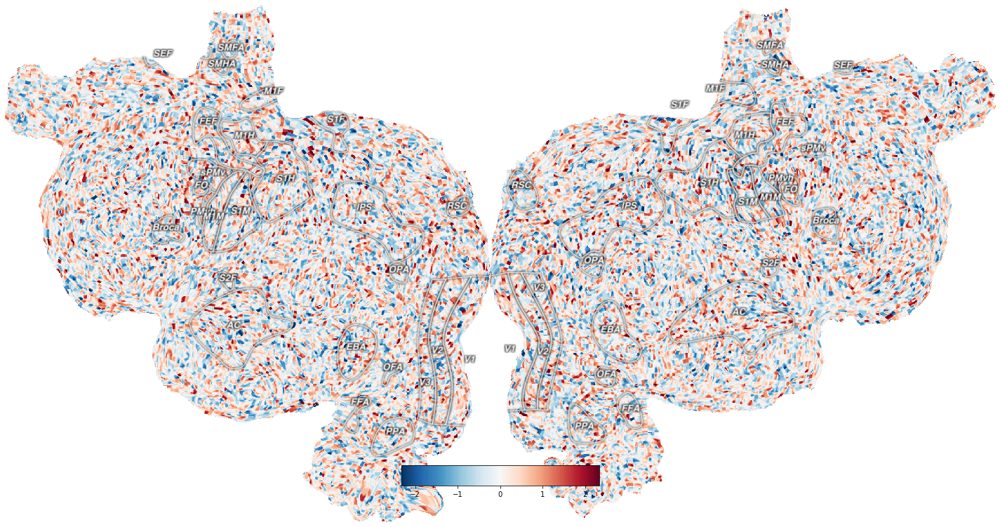

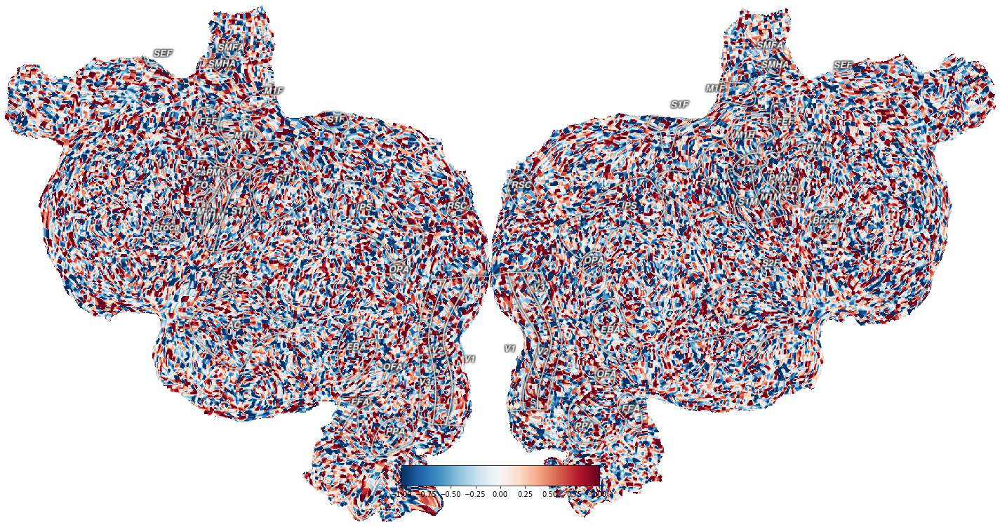

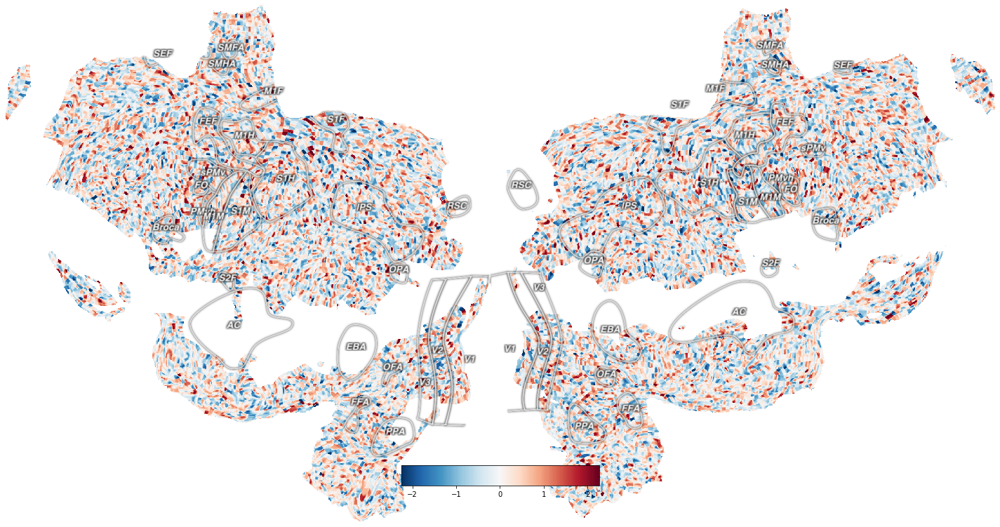

In [5]:
subject = 'S1'
xfm = 'fullhead'

# Creating a random dataset that is the shape for this transform with one
# entry for each voxel
test_data = np.random.randn(31, 100, 100)

# This creates a Volume object for our test dataset for the given subject
# and transform
vol_data = cortex.Volume(test_data, subject, xfm)
cortex.quickshow(vol_data)
plt.show()

# Can also alter the minimum and maximum values shown on the colorbar
vol_data_thresh = cortex.Volume(test_data, subject, xfm, vmin=-1, vmax=1)
cortex.quickshow(vol_data_thresh)
plt.show()

# If you have NaN values, those voxels show up transparent on the brain
test_data[10:15, :, :] = np.nan
vol_data_nan = cortex.Volume(test_data, subject, xfm)
cortex.quickshow(vol_data_nan)
plt.show()

# Using your own data

They have all of these fancy registration and importing functions. As far as I can tell, none of them work unless you work with vanilla freesurfer or fmriprep. Not too helpful. 

### BUT

The sample data they provide is in 1mm space, and they've helpfully provided surface maps as well as some ROI labels already! So really, to get anything plotted, we just need to register our maps to their 1mm space. There are some small caveats.

- For some reason their template image is in a weird orientation. Assuming you're in the fsl MNI standard, you can convert your images using the following.

```fslswapdim MNI152_T1_2mm_brain.nii.gz x -z y swapdim_MNI.nii.gz```

- You'll get a better registration on a brain-extracted image

``` bet /home/njchiang/github/pycortex/filestore/db/S1/anatomical/raw.nii.gz brainmask.nii.gz```

- Then, you can align your swapped MNI with their raw image

```flirt -in swapdim_MNI.nii.gz -ref brainmask.nii.gz -omat to_pycortex.mat```

There are two steps to getting your images into their space. 

1. ``` fslswapdim your_image.nii.gz x -z y swapdim_your_image.nii.gz ```

2. ``` flirt -in swapdim_your_image -out [out name] -ref brainmask.nii.gz -applyxfm -init to_pycortex.mat ```

In my case...

In [6]:
# %%bash
# fslswapdim MNI152_T1_2mm_brain.nii.gz x -z y swapdim_MNI.nii.gz
# flirt -in swapdim_MNI.nii.gz -ref brainmask.nii.gz -omat to_pycortex.mat
# for s in sub* 
# do 
#     fslswapdim ${s} x -z y swapdim/${s}
#     flirt -in swapdim/${s} \
#           -out swapdim/reg/${s} \
#           -ref ~/github/pycortex/filestore/db/S1/anatomicals/raw.nii.gz \
#           -applyxfm -init to_pycortex.mat ; 
# done

In [8]:

def plot_nifti(fname, thr=0, upper=0.2):
    subject = 'S1'
    xfm = 'identity'

    dat = nib.load(fname).get_data()
    dat[dat <= thr] = np.nan
    # Creating a random dataset that is the shape for this transform with one
    # entry for each voxel

    # This creates a Volume object for our test dataset for the given subject
    # and transform
    vol_data = cortex.Volume(dat, subject, xfm, vmin=thr, vmax=upper, cmap="autumn")
    cortex.quickshow(vol_data, with_curvature=True, curvature_threshold=True)
    plt.show()
    return vol_data


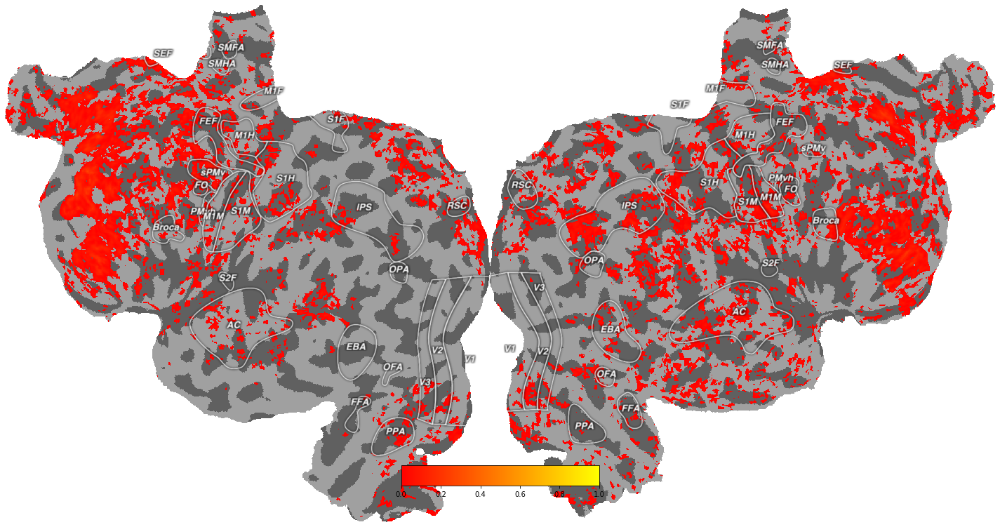

In [8]:
fname = "AB-BART-percentsig.nii.gz"
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/singlesubject-ab-encoding/swapdim/reg"
rootdir = "/Users/njchiang/Downloads/vis/singlesubject-ab-encoding/swapdim/reg"

volume = plot_nifti(os.path.join(rootdir, fname), upper=1)

Since we brought it into their space, there's no need to do any further registration! Their `xfm` stuff is kind of broken. So, we can use the `identity` transform to directly visualize our images!

We can use their default subject name S1 because it is now our "standard" visualization space

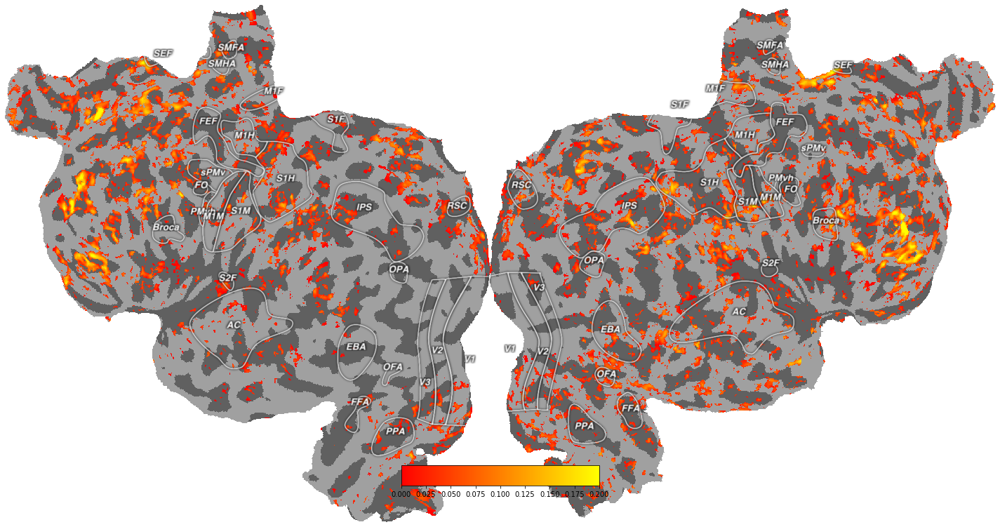

In [9]:

fname = "sub-0015.nii.gz"
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/singlesubject-ab-encoding/swapdim/reg"
rootdir = "/Users/njchiang/Downloads/vis/singlesubject-ab-encoding/swapdim/reg"

volume = plot_nifti(os.path.join(rootdir, fname), upper=0.2)

In [10]:
cortex.webgl.show(data=volume, with_rois=False)


Started server on port 11740


<JS: window.viewer>

In [11]:
from cortex.export import plot_panels, params_flatmap_lateral_medial, save_3d_views

params_flatmap_lateral_medial

{'figsize': [16, 9],
 'panels': [{'extent': [0.0, 0.2, 1.0, 0.8],
   'view': {'angle': 'flatmap', 'surface': 'flatmap'}},
  {'extent': [0.3, 0.0, 0.2, 0.2],
   'view': {'hemisphere': 'left',
    'angle': 'medial_pivot',
    'surface': 'inflated'}},
  {'extent': [0.5, 0.0, 0.2, 0.2],
   'view': {'hemisphere': 'right',
    'angle': 'medial_pivot',
    'surface': 'inflated'}},
  {'extent': [0.0, 0.0, 0.3, 0.3],
   'view': {'hemisphere': 'left',
    'angle': 'lateral_pivot',
    'surface': 'inflated'}},
  {'extent': [0.7, 0.0, 0.3, 0.3],
   'view': {'hemisphere': 'right',
    'angle': 'lateral_pivot',
    'surface': 'inflated'}}]}

In [12]:

# plot_panels(vol_data, **params_flatmap_lateral_medial)
# the better plot

# base_name = "/home/njchiang/data/Downloads/"

def save_figures(vol_data, base_name):
    panels = params_flatmap_lateral_medial["panels"]

    angles_and_surfaces = [(panel['view']['angle'], panel['view']['surface'])
                               for panel in panels]
    # remove redundant couples, e.g. left and right
    angles_and_surfaces = list(set(angles_and_surfaces))
    list_angles, list_surfaces = list(zip(*angles_and_surfaces))



    filenames = save_3d_views(vol_data, base_name, list_angles=list_angles,
                                  list_surfaces=list_surfaces, trim=True, 
                                  viewer_params=dict(labels_visible=[], overlays_visible=[]),
                                  size=(1600 * 4, 900 * 4))
    return filenames

In [13]:
filenames = save_figures(volume, "/Users/njchiang/Downloads/fig")

Started server on port 36058
{'camera.azimuth': 180, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 180, 'camera.altitude': 0, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 1, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 0, 'surface.{subject}.specularity': 0}
waiting for camera.altitude 0.1 -> 0
[Errno 2] No such file or directory: 'convert': 'convert'
{'camera.azimuth': 0, 'camera.altitude': 90, 'camera.target': [0, 0, 0], 'surface.{subject}.unfold': 0.5, 'surface.{subject}.pivot': 180, 'surface.{subject}.shift': 10, 'surface.{subject}.specularity': 0}
[Errno 2] No such file or directory: 'convert': 'convert'
Stopping server


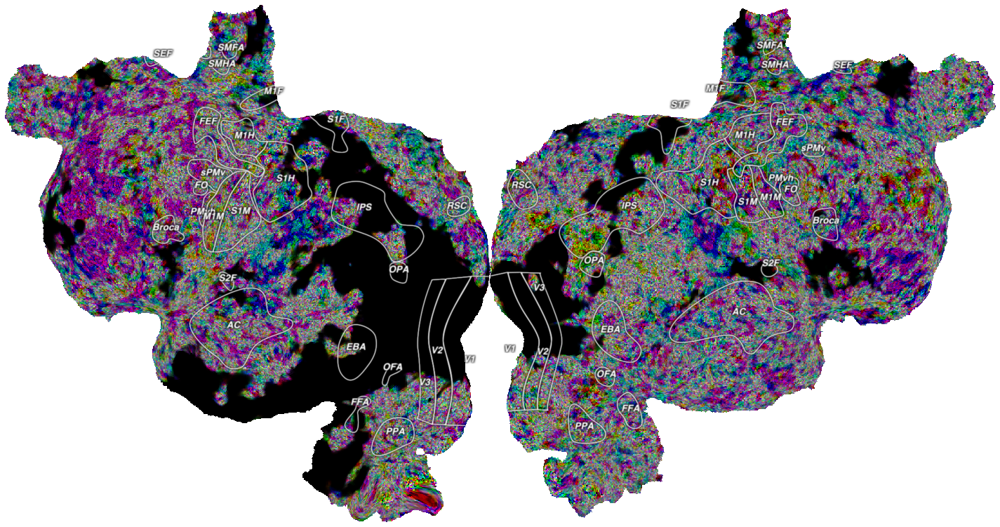

In [27]:
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/betas/reg"
# colorbrewer
# do for every subject

rootdir = "/Users/njchiang/Downloads/vis/betas/reg"
sub = 3
bart = "BART"
r1 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3a.nii.gz{sub:04d}.nii.gz"))
r2 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3f.nii.gz{sub:04d}.nii.gz"))
r3 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3h.nii.gz{sub:04d}.nii.gz"))
r4 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4b.nii.gz{sub:04d}.nii.gz"))
r5 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4d.nii.gz{sub:04d}.nii.gz"))
r6 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4g.nii.gz{sub:04d}.nii.gz"))
r7 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8a.nii.gz{sub:04d}.nii.gz"))
r8 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8b.nii.gz{sub:04d}.nii.gz"))
r9 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8d.nii.gz{sub:04d}.nii.gz"))


def clip(vals, thr=0, norm=True):
    vals[vals <= thr] = thr
    if norm:
        vals = vals / np.max(norm) * 255
    return vals

# rel1 = (r1.get_data() + r2.get_data() + r3.get_data()) / 3
# rel2 = (r4.get_data() + r5.get_data() + r6.get_data()) / 3
# rel3 = (r7.get_data() + r8.get_data() + r9.get_data()) / 3

rel1 = (clip(r1.get_data()) + clip(r2.get_data()) + clip(r3.get_data())) / 3
rel2 = (clip(r4.get_data()) + clip(r5.get_data()) + clip(r6.get_data())) / 3
rel3 = (clip(r7.get_data()) + clip(r8.get_data()) + clip(r9.get_data())) / 3

del r1, r2, r3, r4, r5, r6, r7, r8, r9



# rel1_scaled = rel1 / np.max(rel1) * 255
# rel2_scaled = rel2 / np.max(rel2) * 255
# rel3_scaled = rel3 / np.max(rel3) * 255

# rel1_scaled[rel1_scaled <= 0] = 0
# rel2_scaled[rel2_scaled <= 0] = 0
# rel3_scaled[rel3_scaled <= 0] = 0

# red = cortex.Volume(rel1_scaled.astype(np.uint8), 'S1', 'identity')
# green = cortex.Volume(rel2_scaled.astype(np.uint8), 'S1', 'identity')
# blue = cortex.Volume(rel3_scaled.astype(np.uint8), 'S1', 'identity')


red = cortex.Volume(rel1.astype(np.uint8), 'S1', 'identity')
green = cortex.Volume(rel2.astype(np.uint8), 'S1', 'identity')
blue = cortex.Volume(rel3.astype(np.uint8), 'S1', 'identity')

vol_data = cortex.VolumeRGB(red, green, blue, 'S1')

cortex.quickshow(vol_data, with_colorbar=False, with_curvature=True, curvature_contrast=0.2)
plt.show()

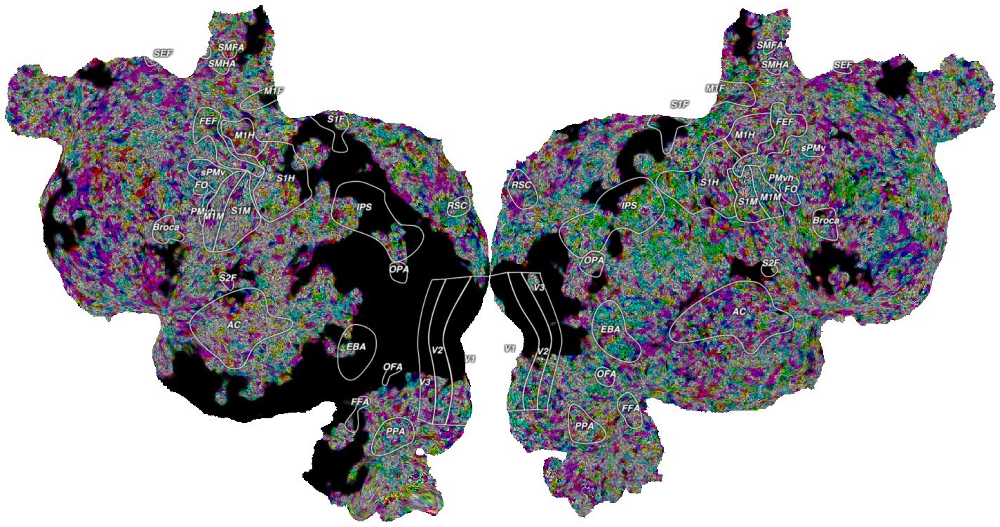

In [24]:
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/betas/reg"
# colorbrewer
# do for every subject

rootdir = "/Users/njchiang/Downloads/vis/betas/reg"
sub = 15
bart = "BART"
r1 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3a.nii.gz{sub:04d}.nii.gz"))
r2 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3f.nii.gz{sub:04d}.nii.gz"))
r3 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_3h.nii.gz{sub:04d}.nii.gz"))
r4 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4b.nii.gz{sub:04d}.nii.gz"))
r5 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4d.nii.gz{sub:04d}.nii.gz"))
r6 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_4g.nii.gz{sub:04d}.nii.gz"))
r7 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8a.nii.gz{sub:04d}.nii.gz"))
r8 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8b.nii.gz{sub:04d}.nii.gz"))
r9 = nib.load(os.path.join(rootdir, f"group_{bart}_AB_8d.nii.gz{sub:04d}.nii.gz"))


def clip(vals, thr=0, norm=True):
    vals[vals <= thr] = thr
    if norm:
        vals = vals / np.max(norm) * 255
    return vals

# rel1 = (r1.get_data() + r2.get_data() + r3.get_data()) / 3
# rel2 = (r4.get_data() + r5.get_data() + r6.get_data()) / 3
# rel3 = (r7.get_data() + r8.get_data() + r9.get_data()) / 3

rel1 = (clip(r1.get_data()) + clip(r2.get_data()) + clip(r3.get_data())) / 3
rel2 = (clip(r4.get_data()) + clip(r5.get_data()) + clip(r6.get_data())) / 3
rel3 = (clip(r7.get_data()) + clip(r8.get_data()) + clip(r9.get_data())) / 3

del r1, r2, r3, r4, r5, r6, r7, r8, r9



# rel1_scaled = rel1 / np.max(rel1) * 255
# rel2_scaled = rel2 / np.max(rel2) * 255
# rel3_scaled = rel3 / np.max(rel3) * 255

# rel1_scaled[rel1_scaled <= 0] = 0
# rel2_scaled[rel2_scaled <= 0] = 0
# rel3_scaled[rel3_scaled <= 0] = 0

# red = cortex.Volume(rel1_scaled.astype(np.uint8), 'S1', 'identity')
# green = cortex.Volume(rel2_scaled.astype(np.uint8), 'S1', 'identity')
# blue = cortex.Volume(rel3_scaled.astype(np.uint8), 'S1', 'identity')


red = cortex.Volume(rel1.astype(np.uint8), 'S1', 'identity')
green = cortex.Volume(rel2.astype(np.uint8), 'S1', 'identity')
blue = cortex.Volume(rel3.astype(np.uint8), 'S1', 'identity')

vol_data = cortex.VolumeRGB(red, green, blue, 'S1')

cortex.quickshow(vol_data, with_colorbar=False, with_curvature=True, curvature_contrast=0.2)
plt.show()

Stopping server


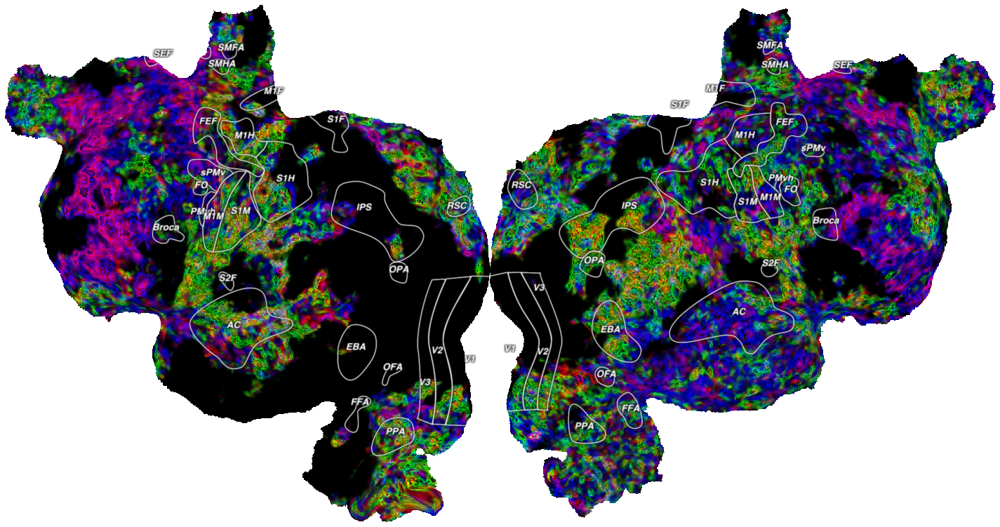

In [29]:
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/betas/reg"
# colorbrewer
# do for every subject

rootdir = "/Users/njchiang/Downloads/vis/betas/reg"

bart = "BARTnorm"
r1 = nib.load(os.path.join(rootdir, f"n1000-AB_3a_{bart}_tstat1.nii.gz"))
r2 = nib.load(os.path.join(rootdir, f"n1000-AB_3f_{bart}_tstat1.nii.gz"))
r3 = nib.load(os.path.join(rootdir, f"n1000-AB_3h_{bart}_tstat1.nii.gz"))
r4 = nib.load(os.path.join(rootdir, f"n1000-AB_4b_{bart}_tstat1.nii.gz"))
r5 = nib.load(os.path.join(rootdir, f"n1000-AB_4d_{bart}_tstat1.nii.gz"))
r6 = nib.load(os.path.join(rootdir, f"n1000-AB_4g_{bart}_tstat1.nii.gz"))
r7 = nib.load(os.path.join(rootdir, f"n1000-AB_8a_{bart}_tstat1.nii.gz"))
r8 = nib.load(os.path.join(rootdir, f"n1000-AB_8b_{bart}_tstat1.nii.gz"))
r9 = nib.load(os.path.join(rootdir, f"n1000-AB_8d_{bart}_tstat1.nii.gz"))

def clip(vals, thr=0, norm=True):
    vals[vals <= thr] = thr
    if norm:
        vals = vals / np.max(norm) * 255
    return vals

# rel1 = (r1.get_data() + r2.get_data() + r3.get_data()) / 3
# rel2 = (r4.get_data() + r5.get_data() + r6.get_data()) / 3
# rel3 = (r7.get_data() + r8.get_data() + r9.get_data()) / 3

rel1 = (clip(r1.get_data()) + clip(r2.get_data()) + clip(r3.get_data())) / 3
rel2 = (clip(r4.get_data()) + clip(r5.get_data()) + clip(r6.get_data())) / 3
rel3 = (clip(r7.get_data()) + clip(r8.get_data()) + clip(r9.get_data())) / 3

del r1, r2, r3, r4, r5, r6, r7, r8, r9

# rel1[rel1 <= 0] = 0
# rel2[rel2 <= 0] = 0
# rel3[rel3 <= 0] = 0

# rel1_scaled = rel1 / np.max(rel1) * 255
# rel2_scaled = rel2 / np.max(rel2) * 255
# rel3_scaled = rel3 / np.max(rel3) * 255

# rel1_scaled[rel1_scaled <= 0] = 0
# rel2_scaled[rel2_scaled <= 0] = 0
# rel3_scaled[rel3_scaled <= 0] = 0

# red = cortex.Volume(rel1_scaled.astype(np.uint8), 'S1', 'identity')
# green = cortex.Volume(rel2_scaled.astype(np.uint8), 'S1', 'identity')
# blue = cortex.Volume(rel3_scaled.astype(np.uint8), 'S1', 'identity')

red = cortex.Volume(rel1.astype(np.uint8), 'S1', 'identity')
green = cortex.Volume(rel2.astype(np.uint8), 'S1', 'identity')
blue = cortex.Volume(rel3.astype(np.uint8), 'S1', 'identity')

vol_data = cortex.VolumeRGB(red, green, blue, 'S1')

cortex.quickshow(vol_data, with_colorbar=False, with_curvature=True, curvature_contrast=0.2)
plt.show()

In [30]:
cortex.webgl.show(data=vol_data, with_rois=False)

Started server on port 48890


<JS: window.viewer>

Stopping server
Stopping server


In [11]:
# filenames = save_figures(vol_data, "/Users/njchiang/Downloads/betas")

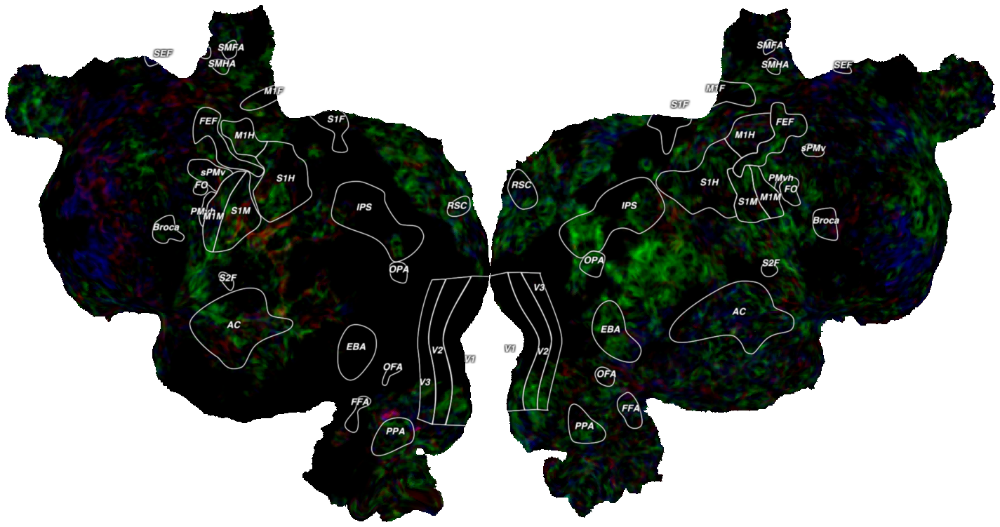

In [12]:
# rootdir = "/home/njchiang/data/fmri/Analogy/analysis/group/encoding/vis/betas/reg"
rootdir = "/Users/njchiang/Downloads/vis/betas/reg"

bart = "BART"
r1 = nib.load(os.path.join(rootdir, f"n1000-AB_3a_{bart}_tstat1.nii.gz"))
r2 = nib.load(os.path.join(rootdir, f"n1000-AB_3f_{bart}_tstat1.nii.gz"))
r3 = nib.load(os.path.join(rootdir, f"n1000-AB_3h_{bart}_tstat1.nii.gz"))
r4 = nib.load(os.path.join(rootdir, f"n1000-AB_4b_{bart}_tstat1.nii.gz"))
r5 = nib.load(os.path.join(rootdir, f"n1000-AB_4d_{bart}_tstat1.nii.gz"))
r6 = nib.load(os.path.join(rootdir, f"n1000-AB_4g_{bart}_tstat1.nii.gz"))
r7 = nib.load(os.path.join(rootdir, f"n1000-AB_8a_{bart}_tstat1.nii.gz"))
r8 = nib.load(os.path.join(rootdir, f"n1000-AB_8b_{bart}_tstat1.nii.gz"))
r9 = nib.load(os.path.join(rootdir, f"n1000-AB_8d_{bart}_tstat1.nii.gz"))

rel1 = (r1.get_data() + r2.get_data() + r3.get_data()) / 3
rel2 = (r4.get_data() + r5.get_data() + r6.get_data()) / 3
rel3 = (r7.get_data() + r8.get_data() + r9.get_data()) / 3

del r1, r2, r3, r4, r5, r6, r7, r8, r9

rel1_scaled = rel1 / np.max(rel1) * 255
rel2_scaled = rel2 / np.max(rel2) * 255
rel3_scaled = rel3 / np.max(rel3) * 255

rel1_scaled[rel1_scaled <= 0] = 0
rel2_scaled[rel2_scaled <= 0] = 0
rel3_scaled[rel3_scaled <= 0] = 0

red = cortex.Volume(rel1_scaled.astype(np.uint8), 'S1', 'identity')
green = cortex.Volume(rel2_scaled.astype(np.uint8), 'S1', 'identity')
blue = cortex.Volume(rel3_scaled.astype(np.uint8), 'S1', 'identity')

vol_data = cortex.VolumeRGB(red, green, blue, 'S1')

cortex.quickshow(vol_data, with_colorbar=False, with_curvature=True, curvature_contrast=0.2)
plt.show()

In [13]:
cortex.webgl.show(data=vol_data, with_rois=False)

Started server on port 59025


<JS: window.viewer>